In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
from pathlib import Path
import pandas as pd
from ydata_profiling import ProfileReport
from ydata_profiling.utils.cache import cache_file



from google.colab import files

import matplotlib.pyplot as plt
import seaborn as sns


In [5]:
file_path = '/content/drive/MyDrive/IS733/Project/household.csv'

df = pd.read_csv(file_path)

In [6]:
df = df.drop('HHAGE', axis=1)

In [7]:
# Generate the Profiling Report
profile = ProfileReport(
    df, title="Household Dataset", html={"style": {"full_width": True}}, sort=None
)

In [8]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
profile.to_file("household.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [12]:

# Download the HTML file
files.download("household.html")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#Employment Status of Householders

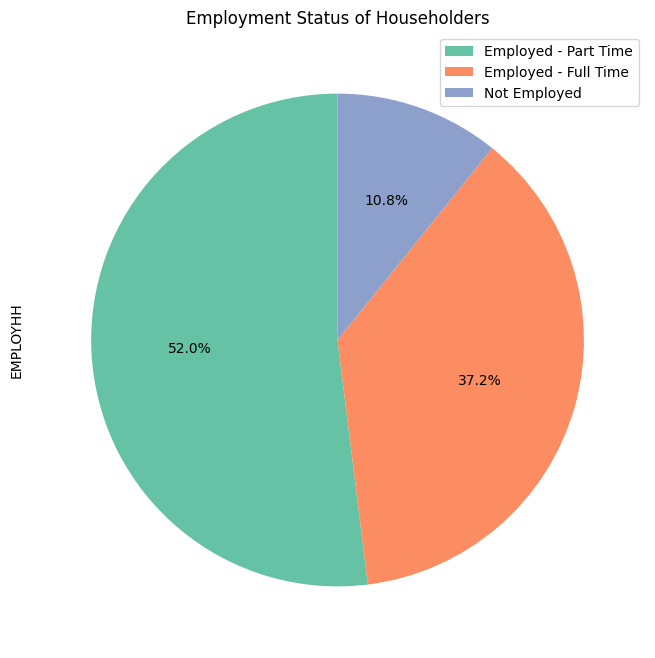

In [13]:
# Assuming df is your DataFrame
plt.figure(figsize=(8, 8))

# Define a custom color palette
colors = ['#66c2a5', '#fc8d62', '#8da0cb']

# Map employment categories to meaningful labels
employment_labels = {
    0: 'Not Employed',
    1: 'Employed - Full Time',
    2: 'Employed - Part Time'
}

# Plot the pie chart
df['EMPLOYHH'].value_counts().plot.pie(
    autopct='%1.1f%%',
    startangle=90,
    colors=colors,
    labels=None  # Don't show default labels
)

# Add legend
plt.legend([employment_labels[i] for i in df['EMPLOYHH'].unique()], loc='best')

plt.title('Employment Status of Householders')
plt.show()


#Household Composition

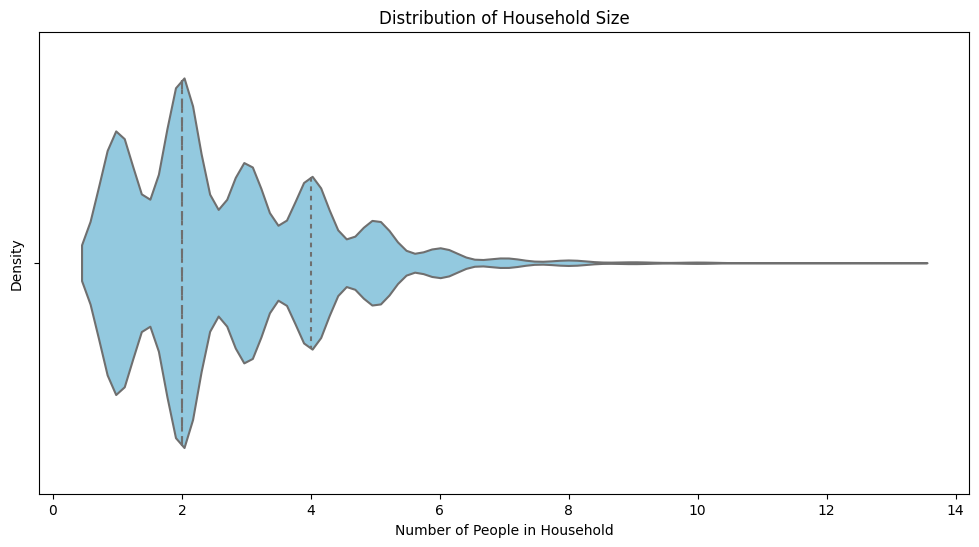

In [14]:
plt.figure(figsize=(12, 6))

# Create a violin plot
sns.violinplot(x=df['NHSLDMEM'], color='skyblue', inner='quartile')

plt.title('Distribution of Household Size')
plt.xlabel('Number of People in Household')
plt.ylabel('Density')
plt.show()

#Income Distribution

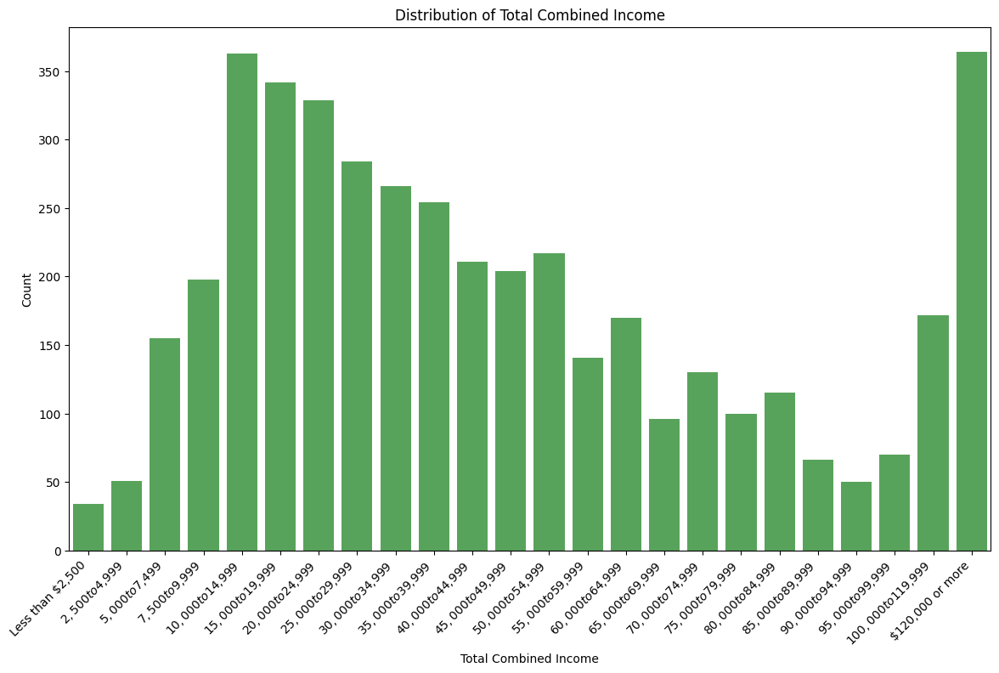

In [15]:
# Get the count of each unique value in the 'MONEYPY' column
income_counts = df['MONEYPY'].value_counts().sort_index()

# Map the numeric codes to income ranges
income_ranges = {
    1: 'Less than $2,500',
    2: '$2,500 to $4,999',
    3: '$5,000 to $7,499',
    4: '$7,500 to $9,999',
    5: '$10,000 to $14,999',
    6: '$15,000 to $19,999',
    7: '$20,000 to $24,999',
    8: '$25,000 to $29,999',
    9: '$30,000 to $34,999',
    10: '$35,000 to $39,999',
    11: '$40,000 to $44,999',
    12: '$45,000 to $49,999',
    13: '$50,000 to $54,999',
    14: '$55,000 to $59,999',
    15: '$60,000 to $64,999',
    16: '$65,000 to $69,999',
    17: '$70,000 to $74,999',
    18: '$75,000 to $79,999',
    19: '$80,000 to $84,999',
    20: '$85,000 to $89,999',
    21: '$90,000 to $94,999',
    22: '$95,000 to $99,999',
    23: '$100,000 to $119,999',
    24: '$120,000 or more'
}

plt.figure(figsize=(14, 8))

# Create a bar plot using a different color
sns.barplot(x=income_counts.index, y=income_counts.values, color='#4CAF50')  # Green color

# Add labels and rotate x-axis labels for better readability
plt.xticks(ticks=range(0, 24), labels=[income_ranges[i] for i in range(1, 25)], rotation=45, ha='right', fontsize=10)

plt.title('Distribution of Total Combined Income')
plt.xlabel('Total Combined Income')
plt.ylabel('Count')
plt.show()

#Distribution of Age of the Householder

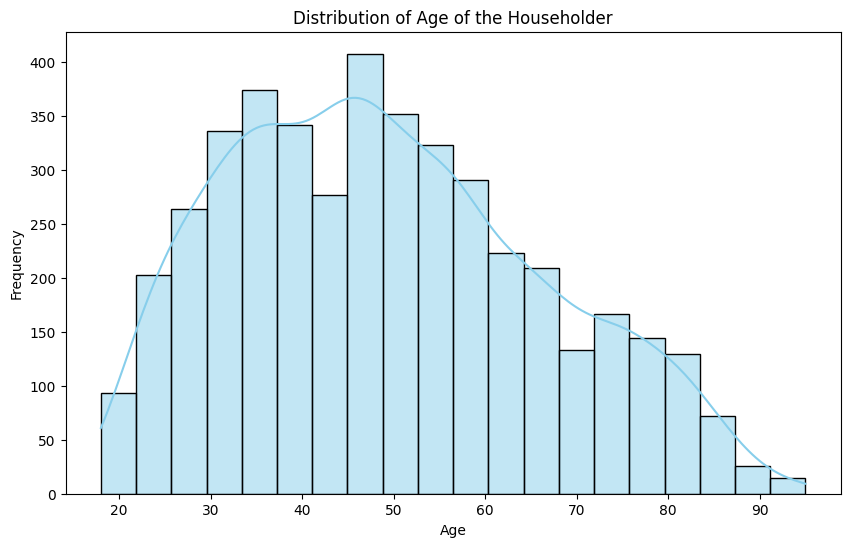

In [16]:
plt.figure(figsize=(10, 6))
sns.histplot(df['AGEHHMEM1'], bins=20, kde=True, color='skyblue')
plt.title('Distribution of Age of the Householder')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()